In [1]:
import pandas as pd

In [2]:
import os.path

file_path = 'cache/data.parquet'
if not os.path.isfile(file_path):
    file_path = 'cache/data.csv'
    df = pd.read_csv(file_path)
else:
    df = pd.read_parquet(file_path)

In [4]:
genres_df = pd.read_parquet('cache/genres.parquet')
languages_df = pd.read_parquet('cache/languages.parquet')
countries_df = pd.read_parquet('cache/countries.parquet')

In [ ]:
mdf = df.merge(genres_df, left_index=True, right_index=True).merge(languages_df, left_index=True, right_index=True).merge(countries_df, left_index=True, right_index=True)

In [7]:
mdfd = df.drop(columns=['languages', 'genres', 'countries', 
                  'title', 'movie_identifier', 'parsed_actor_name', 'actor_identifier', 'identifier', 
                  'category', 'winner', 'oscar_nominated',
                  'actor_gender', 'actor_ethnicity'])

In [ ]:
mdfd['isMale'] = df['actor_gender'].apply(lambda x: 1 if x == 'M' else 0)


In [33]:
ethnicities_df = pd.get_dummies(df['actor_ethnicity'], dtype=int)
# mdfd = mdfd.merge(ethnicities_df, left_index=True, right_index=True)
# mdfd.shape

In [145]:
not_nominated = df.loc[df['oscar_nominated'] != True].index
lost = df.loc[(df['oscar_nominated'] == True) & (df['winner'] == False)].index
won = df.loc[(df['oscar_nominated'] == True) & (df['winner'] == True)].index

def make_targets(nom, win):
    if not nom:
        return 'not nominated'
    elif not win:
        return 'nominated but lost'
    else:
        return 'won oscar'
    
df['target'] = df.apply(lambda x: make_targets(x['oscar_nominated'], x['winner']), axis=1)

# len(won) + len(lost) + len(not_nominated)

In [ ]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt

def run_tsne_analysis(x, perplexity=30, scale=False, return_df=False):
    if scale:
        x_scaled = StandardScaler().fit_transform(x)
    else:
        x_scaled = x
        
    x_embedded = TSNE(perplexity=perplexity).fit_transform(x_scaled)
    
    if return_df:
#         print(x.dtype)
        x_embedded = pd.DataFrame(x_embedded, index=x.index)
    
    return x_embedded

def plot_clusters(df, not_nominated=[], lost=[], won=[], target=[], x_col=0, y_col=1, cs=['tab:red','tab:blue','tab:green'], alphas=[0.03,0.6,0.6], title='clustering'):
    if len(not_nominated) == 0:
#         not_nominated = df.loc[df['oscar_nominated'] != True].index
        not_nominated=target.loc[target=='not nominated'].index
    if len(lost) == 0:
#         lost = df.loc[(df['oscar_nominated'] == True) & (df['winner'] == False)].index
        lost=target.loc[target=='nominated but lost'].index
    if len(won) == 0:
#         won = df.loc[(df['oscar_nominated'] == True) & (df['winner'] == True)].index
        won=target.loc[target=='won oscar'].index
    
    labels = [not_nominated, lost, won]
    
    fig, ax = plt.subplots()
    ax.set_title(title)
    
    for i in range(3):
        ax.scatter(x=df.loc[labels[i], x_col], y=df.loc[labels[i], y_col], c=cs[i], alpha=alphas[i])
        
#     ax.scatter(x=df.loc[:, x_col], y=df.loc[:, y_col], c=target, alpha=0.1)
        
    plt.show()


In [143]:
not_nominated = df.loc[df['oscar_nominated'] != True].index
lost = df.loc[(df['oscar_nominated'] == True) & (df['winner'] == False)].index
won = df.loc[(df['oscar_nominated'] == True) & (df['winner'] == True)].index
len(not_nominated) + len(won) + len(lost)  

23812

In [138]:
mdfd.columns

Index(['box_office_revenue', 'runtime', 'actor_height', 'actor_age', 'year',
       'average_rating', 'number_of_votes', 'number_of_movies_starred_in',
       'average_rating_previous_movies',
       'average_box_office_revenue_previous_movies', 'isMale'],
      dtype='object')

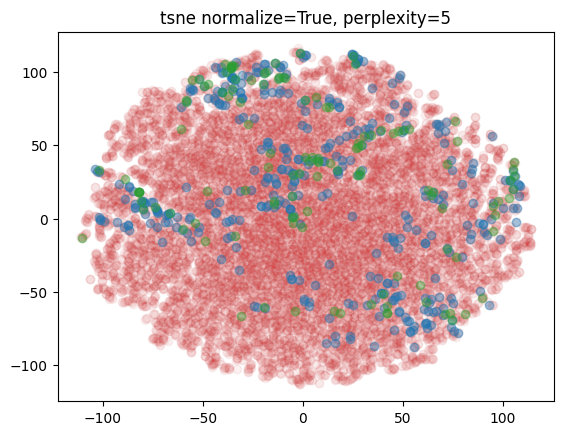

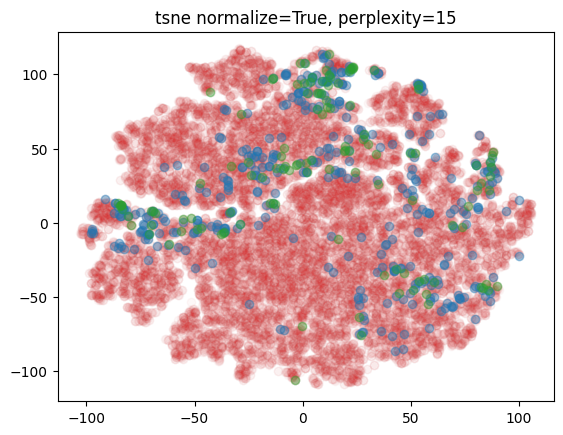

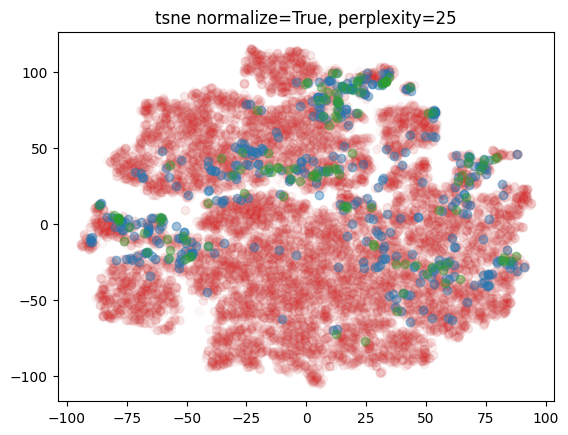

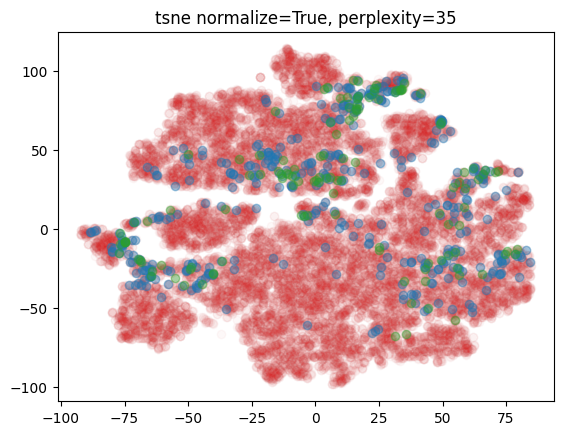

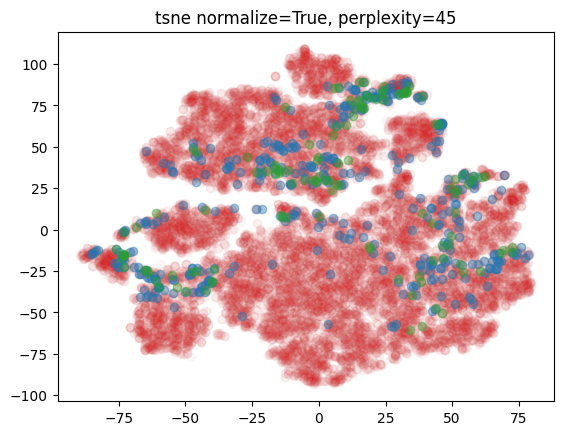

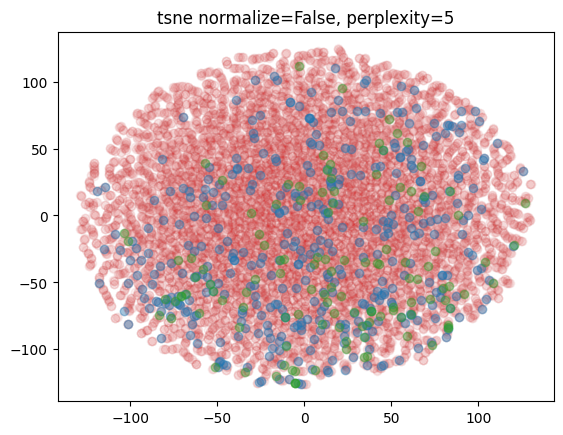

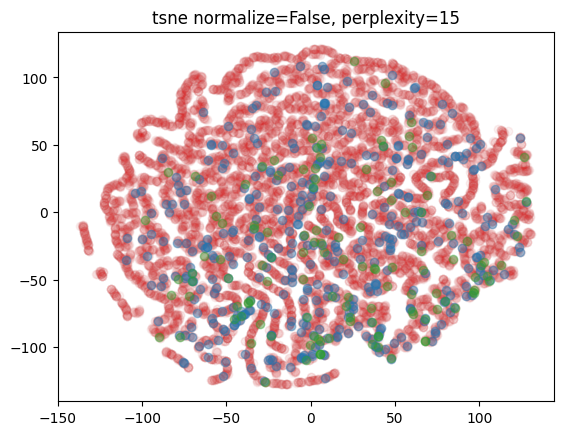

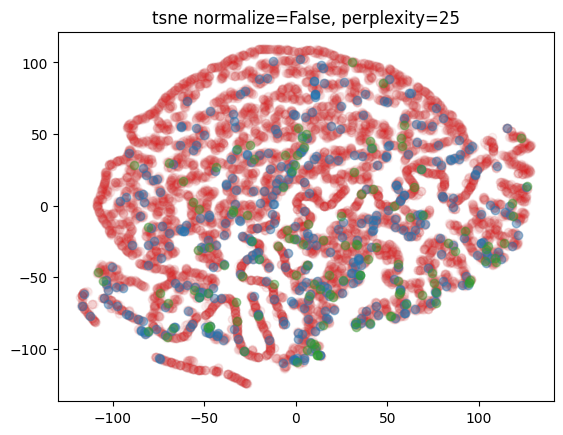

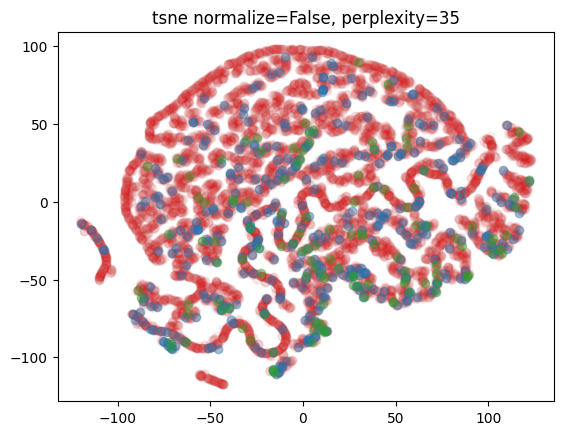

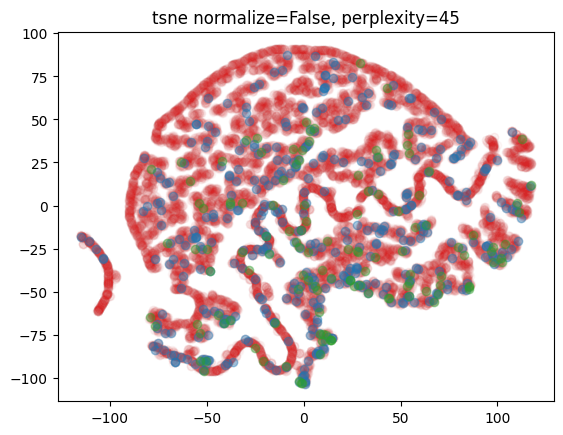

In [30]:
perplexities=[5,15,25,35,45]
scale=[True,False]
for s in scale:
    for p in perplexities:        
        mdfd_tsne_emb = run_tsne_analysis(mdfd, p, s, return_df=True)
        plot_clusters(mdfd_tsne_emb, not_nominated, lost, won, title=('tsne normalize={}, perplexity={}'.format(s, p)))

The plot with (Normalize=True, perplexity=45) shows that some regions should be avoided.

In [31]:
mdfd_og = mdfd.drop(columns=['number_of_movies_starred_in', 'average_rating_previous_movies', 'average_box_office_revenue_previous_movies'])
mdfd_og.columns

Index(['box_office_revenue', 'runtime', 'actor_height', 'actor_age', 'year',
       'average_rating', 'number_of_votes', 'isMale'],
      dtype='object')

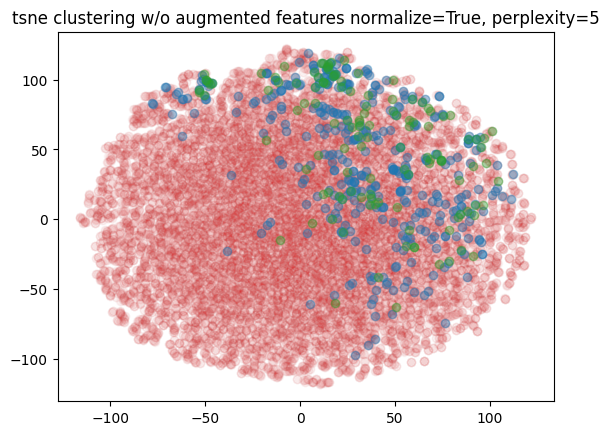

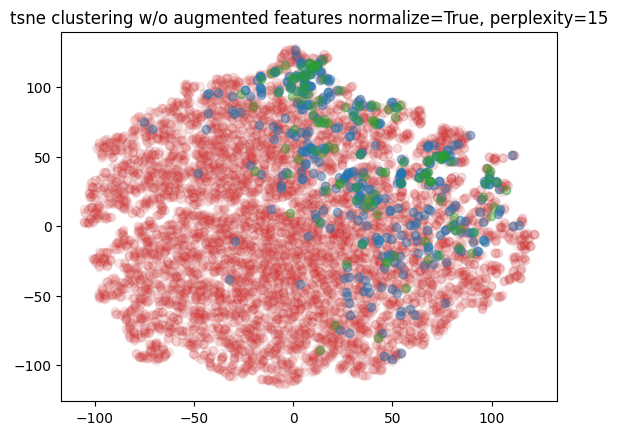

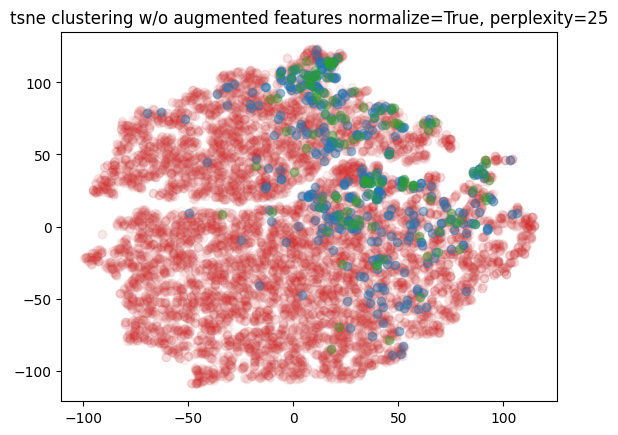

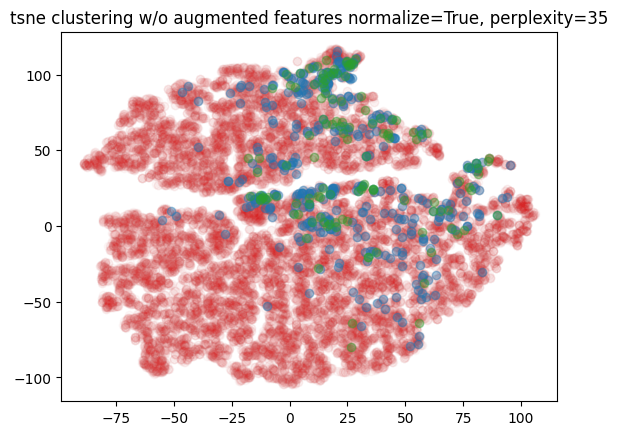

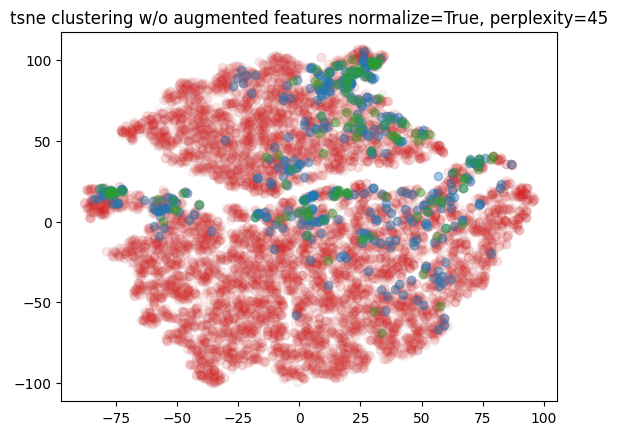

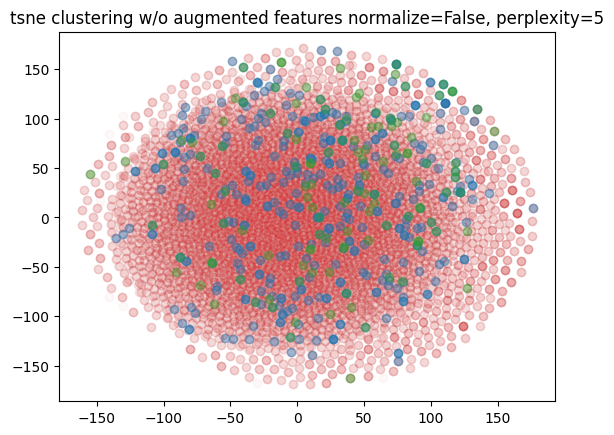

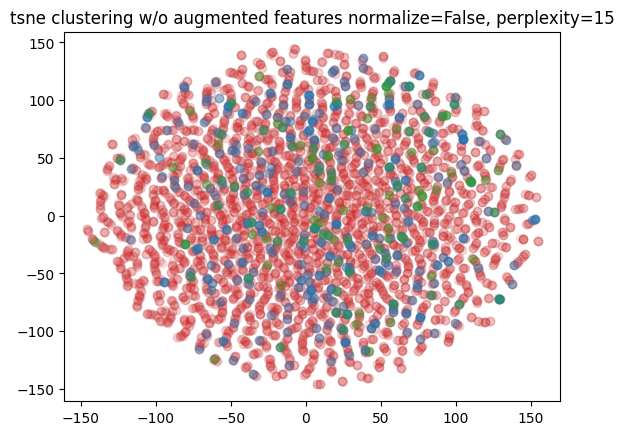

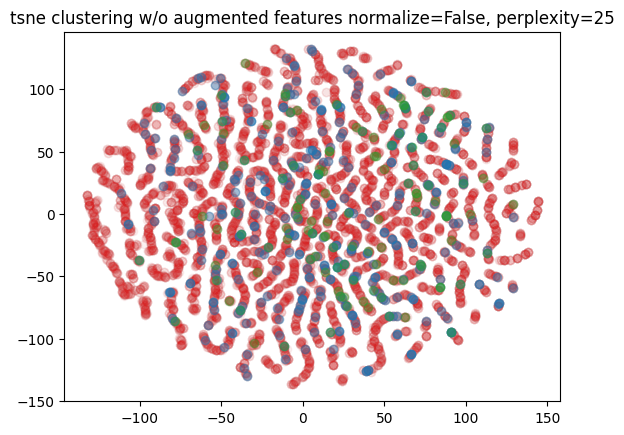

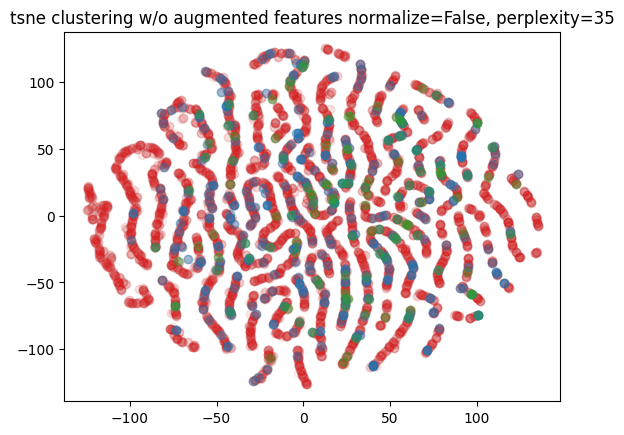

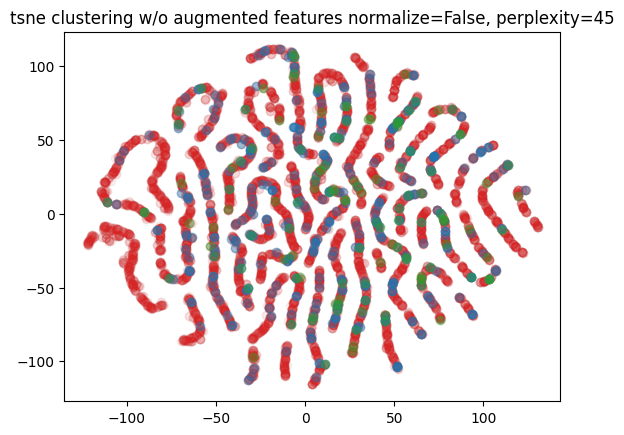

In [32]:
for s in scale:
    for p in perplexities:        
        mdfd_tsne_emb = run_tsne_analysis(mdfd_og, p, s, return_df=True)
        plot_clusters(mdfd_tsne_emb, not_nominated, lost, won, title=('tsne clustering w/o augmented features normalize={}, perplexity={}'.format(s, p)))

The same conclusion can be made as above for the runs of tsne on un-normalized data.<br>
(Interestingly, in both sets of features, normalizing the data results in wins and nominations being scattered everywhere rather than being concentrated in some areas.)

In [129]:
actor_features = pd.DataFrame(mdfd_og, columns=['actor_height', 'actor_age', 'isMale'], index=mdfd_og.index).merge(ethnicities_df, left_index=True, right_index=True)
actor_features.columns

Index(['actor_height', 'actor_age', 'isMale', '/m/012c1l', '/m/012f86',
       '/m/01336l', '/m/013b6_', '/m/013b7g', '/m/013s3n', '/m/013xrm',
       ...
       '/m/0g96wd', '/m/0gf5k1', '/m/0gkxl2', '/m/0h1nk0k', '/m/0h2138',
       '/m/0h6mqq9', '/m/0h8mzsl', '/m/0j4w_', '/m/0x67', '/m/0xnvg'],
      dtype='object', length=283)

In [ ]:
for s in scale:
    for p in perplexities:        
        mdfd_tsne_emb = run_tsne_analysis(actor_features, p, s, return_df=True)
        plot_clusters(mdfd_tsne_emb, not_nominated, lost, won, title=('tsne clustering w/o augmented features normalize={}, perplexity={}'.format(s, p)))

This time, tsne was run on actor features of height, age, gender and ethnicity. 
We get to see interesting shapes.
Again in the plots with normalization and high perplexity (so looking at global structure more) - this time we see clear clusterings, which probably indicate ethnicities. Some clusters appear to have a large number of oscar nominations and winners (Need to visualize better - somehow show ratio of nominations and also indicate total count)

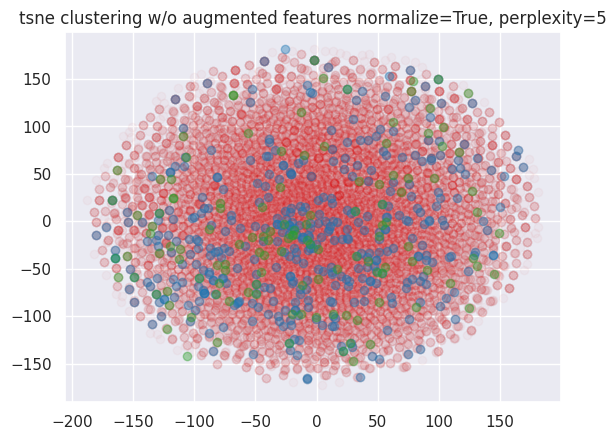

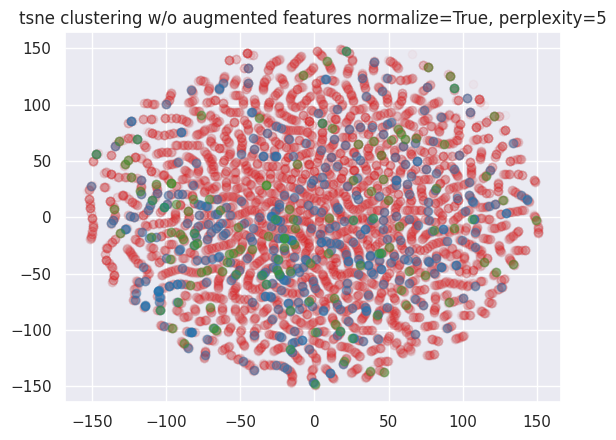

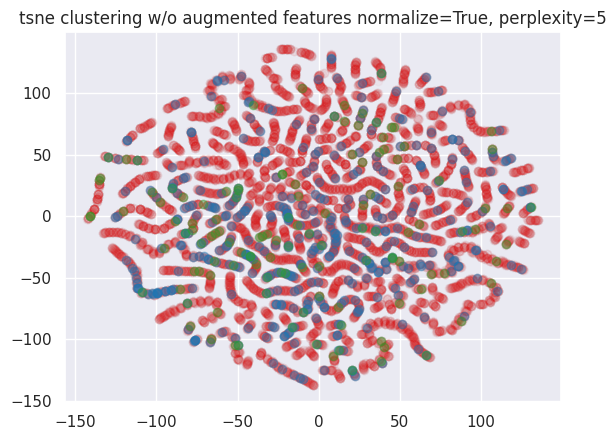

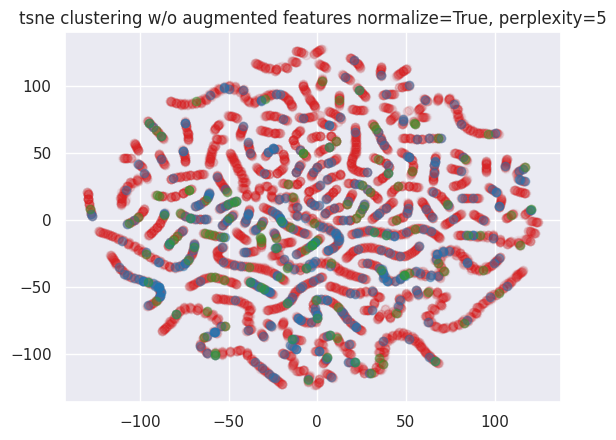

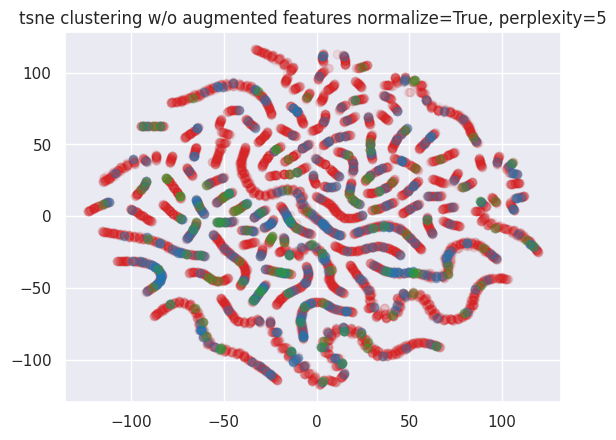

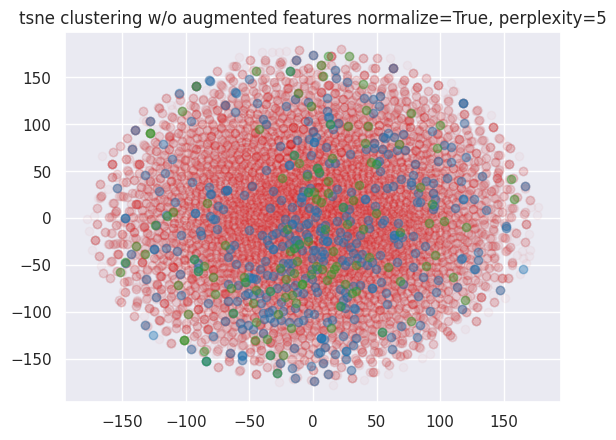

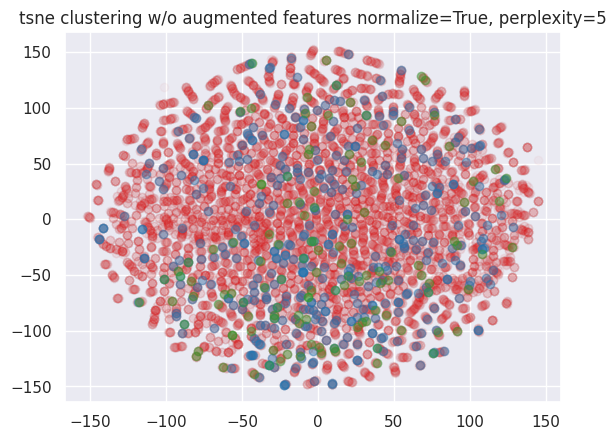

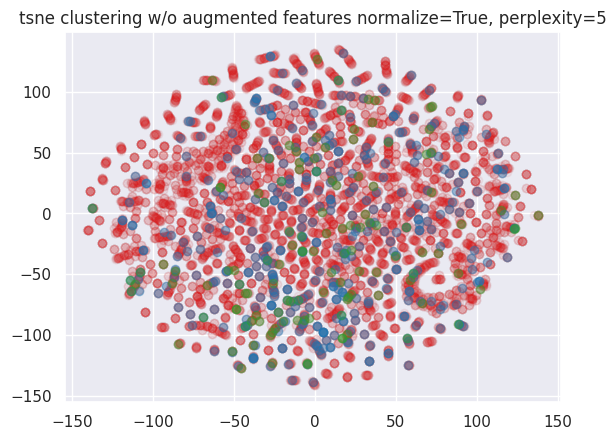

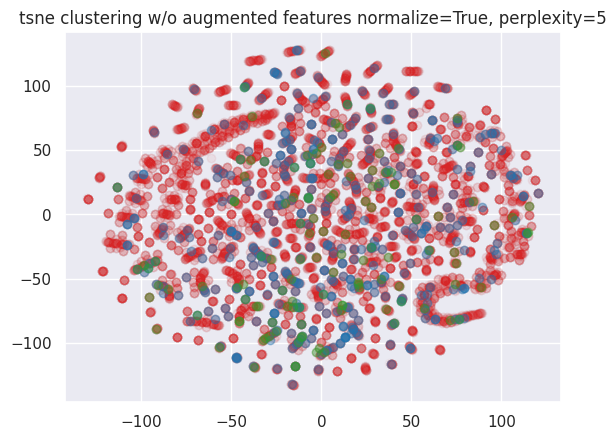

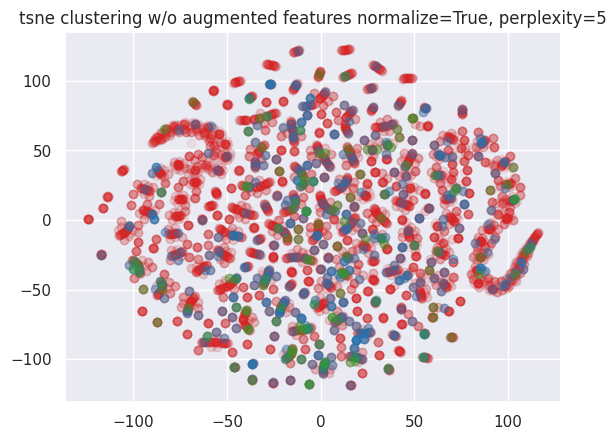

In [163]:
for s in scale:
    for p in perplexities:        
        mdfd_tsne_emb = run_tsne_analysis(ac_df, p, s, return_df=True)
        plot_clusters(mdfd_tsne_emb, not_nominated, lost, won, title=('tsne clustering w/o augmented features normalize={}, perplexity={}'.format(s, p)))

In [39]:
from sklearn.decomposition import PCA

def run_pca_analysis(x, n_components=None, normalize=True):
    if normalize:
        x_n = StandardScaler().fit_transform(x)
    else:
        x_n = x
        
    pca = PCA(n_components)
    x_decomposed = pca.fit_transform(x_n)
    
    return x_decomposed, pca

In [126]:
import seaborn as sns
import matplotlib.pyplot as plt
    

def pca_heatmap(pca_out, df, scale_by_evr=False, vmin=None, vmax=None, round=0):
    loadings = pca_out.components_
    num_pc = pca_out.n_features_in_
    pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
    loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
    loadings_df['features'] = df.columns.values
    loadings_df = loadings_df.set_index('features')
    
    if scale_by_evr:
        loadings_df = loadings_df.mul(pca_out.explained_variance_ratio_)
    
    if round:
        loadings_df = loadings_df.round(round)
    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(loadings_df, annot=True, cmap='Spectral', vmin=vmin, vmax=vmax, linewidth=0.5)
    ax.set_title('correlation of features with the principle components, weighted by explained-variance-ratio = {}'.format(scale_by_evr))
    plt.show()

In [58]:
pca_result, pca = run_pca_analysis(mdfd_og)

/home/tkoch/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


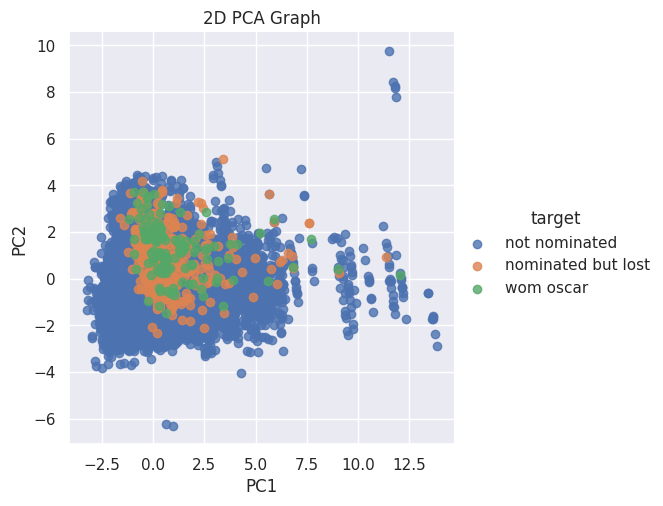

In [101]:
pca_scatter_plot(pca_result, target)

/home/tkoch/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute `n_features_` was deprecated in version 1.2 and will be removed in 1.4. Use `n_features_in_` instead.
  warnings.warn(msg, category=FutureWarning)


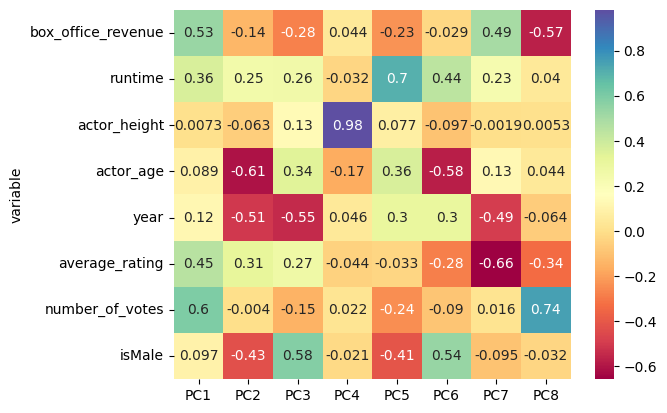

In [59]:
pca_heatmap(pca, mdfd_og)

/home/tkoch/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute `n_features_` was deprecated in version 1.2 and will be removed in 1.4. Use `n_features_in_` instead.
  warnings.warn(msg, category=FutureWarning)


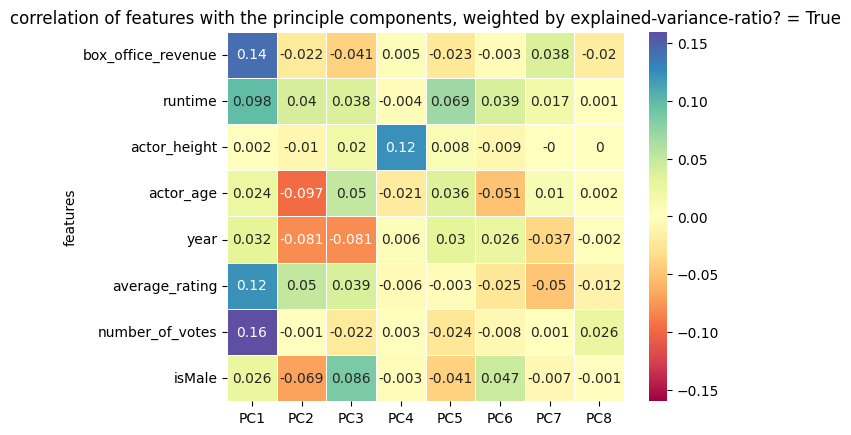

In [70]:
pca_heatmap(pca, mdfd_og, True, vmin=-0.16, vmax=0.16, round=3)

In [71]:
pca_res, pca_out = run_pca_analysis(mdfd)

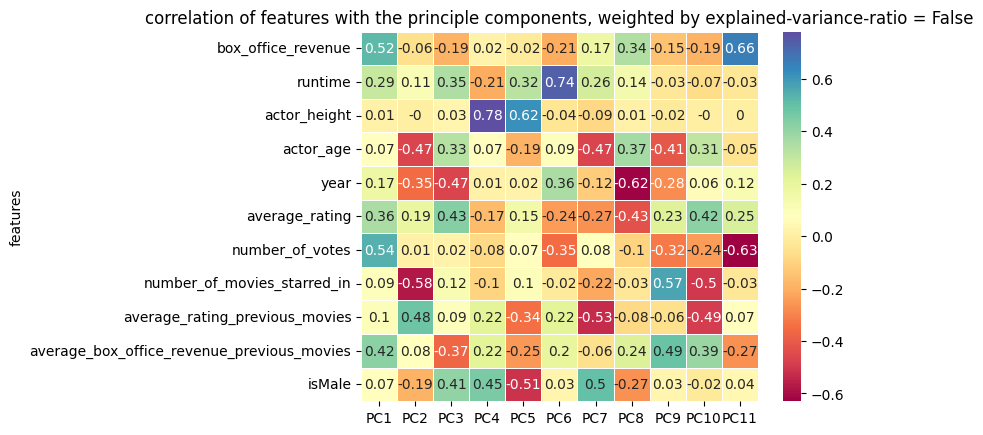

In [77]:
pca_heatmap(pca_out, mdfd, False, round=2)

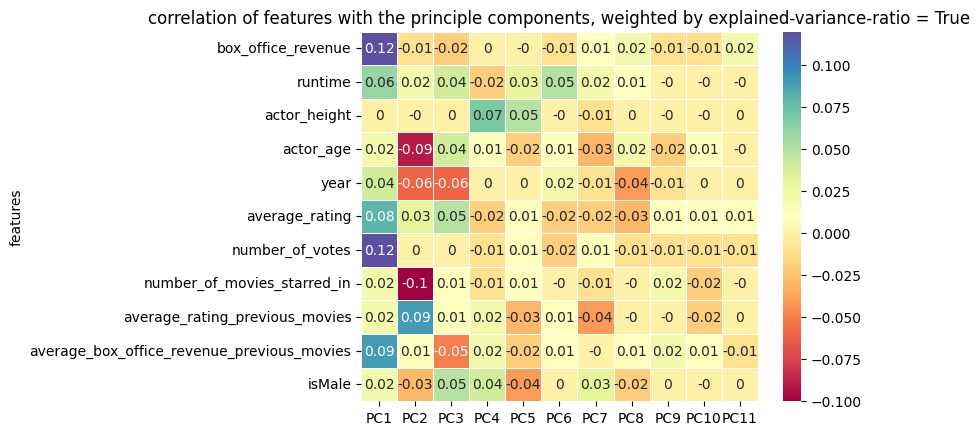

In [76]:
pca_heatmap(pca_out, mdfd, True, round=2)

In [84]:
import numpy as np
def elbow_plot(pca_out):
    evr = pca_out.explained_variance_ratio_
#     cvr = np.cumsum(pca_out.explained_variance_ratio_)
    plt.plot(range(1, len(evr) + 1), evr)
    plt.xlabel('Number of Components')
    plt.ylabel('Explained Variance')
    plt.title('Elbow Plot')
    plt.show()

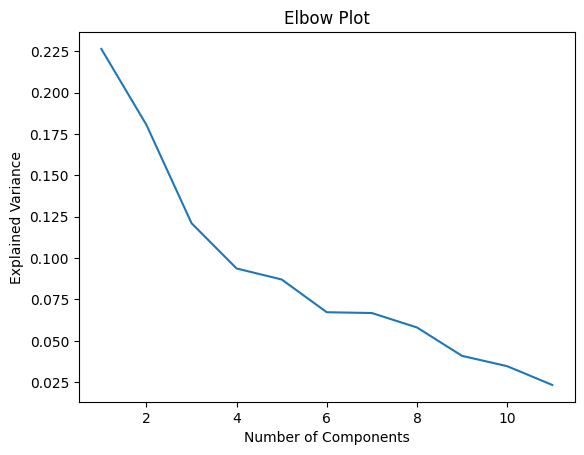

In [85]:
elbow_plot(pca_out)

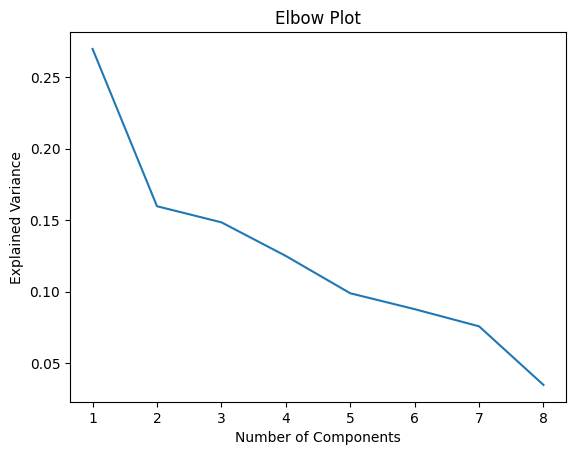

In [86]:
elbow_plot(pca)

In [130]:
def pca_scatter_plot(pca_res, target):
    pca_res_df=pd.DataFrame(pca_res[:, 0:2], index=mdfd.index, columns=['PC1', 'PC2'])
    pca_res_df['target']=target

    sns.lmplot(
        x='PC1', 
        y='PC2', 
        data=pca_res_df, 
        hue='target', 
        fit_reg=False, 
        legend=True
    )

    plt.title('2D PCA Graph')
    plt.show()

In [136]:
def pca_hex_plot(pca_res, target):
    pca_res_df=pd.DataFrame(pca_res[:, 0:2], index=mdfd.index, columns=['PC1', 'PC2'])
    pca_res_df['target']=target

    sns.jointplot(
        x='PC1', 
        y='PC2', 
        data=pca_res_df, 
        kind='hex',
#         hue='target',
    )

    plt.title('2D PCA Graph')
    plt.show()

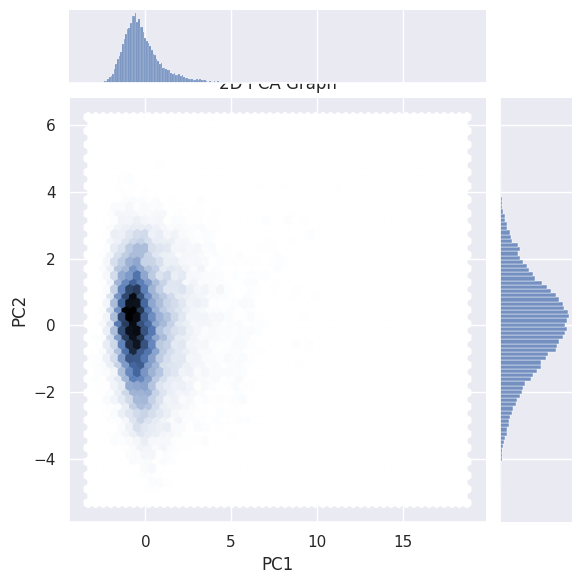

In [137]:
pca_hex_plot(pca_res, target)

/home/tkoch/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


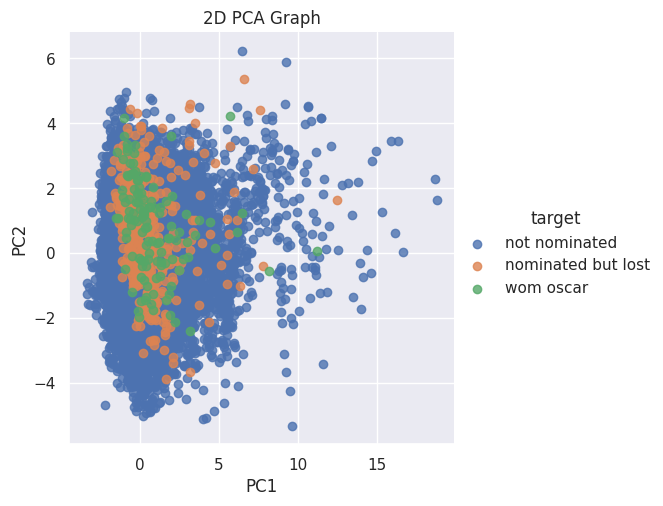

In [100]:
pca_scatter_plot(pca_res, target)

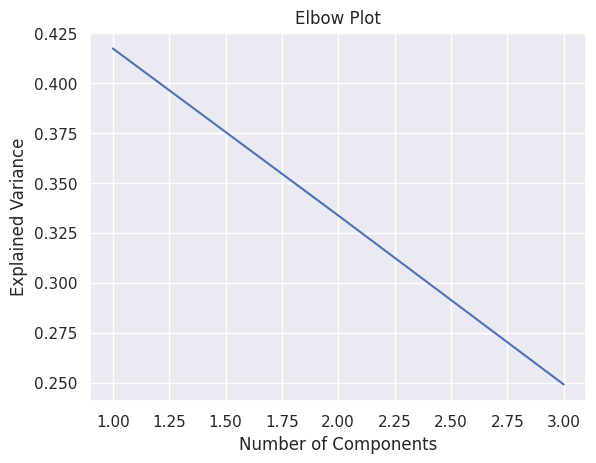

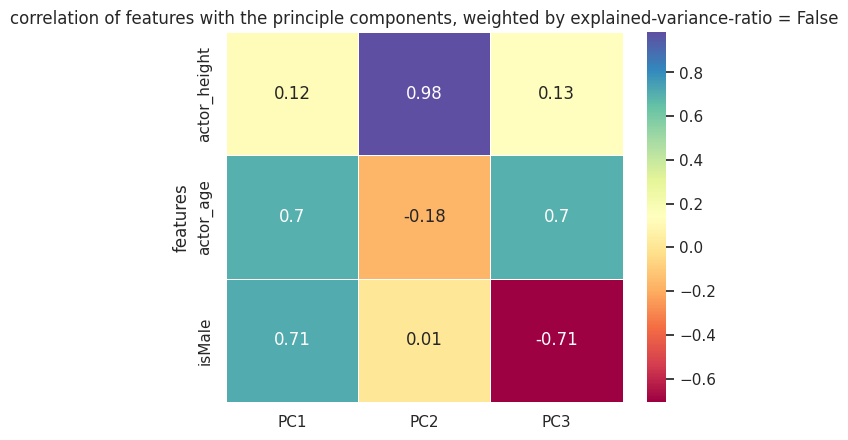

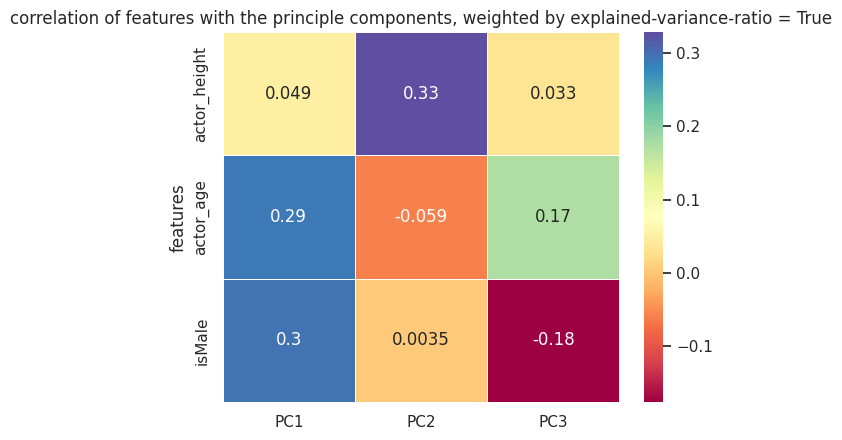

/home/tkoch/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


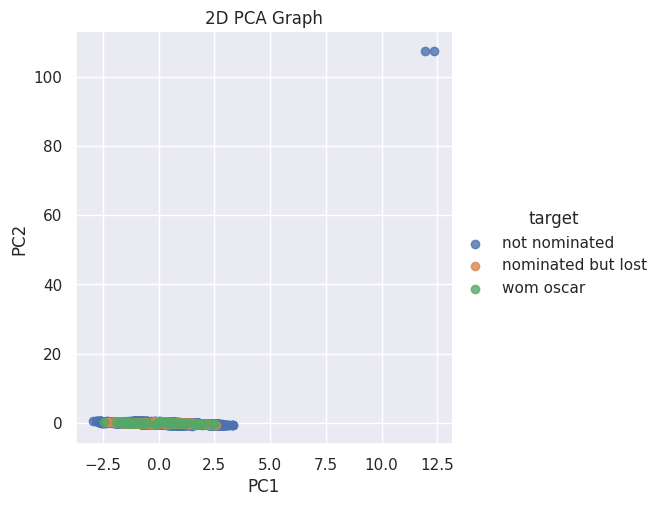

In [110]:
ac_fr = actor_features.loc[:, :'isMale']
pca_res_ac, pca_out_ac = run_pca_analysis(ac_fr)
elbow_plot(pca_out_ac)
pca_heatmap(pca_out_ac, ac_fr, False)
pca_heatmap(pca_out_ac, ac_fr, True)
pca_scatter_plot(pca_res_ac, target)

In [111]:
def get_top_n_columns_by_sum(df, n=10):
  """
  Gets the top N columns of a DataFrame based on their sum.

  Args:
    df: The input DataFrame.
    n: The number of top columns to return.

  Returns:
    A list of the top N column names.
  """

  column_sums = df.sum()
  top_n_columns = column_sums.nlargest(n).index.tolist()
  return top_n_columns

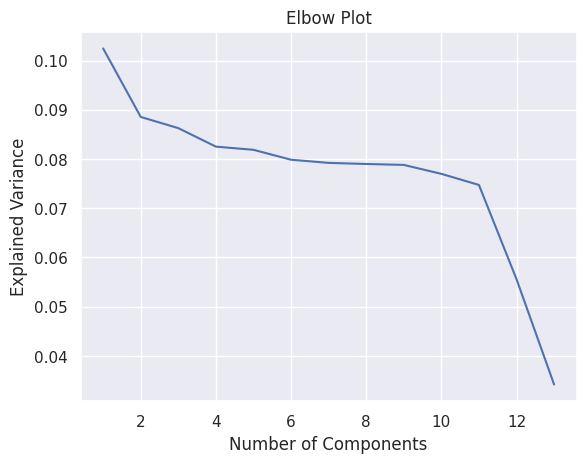

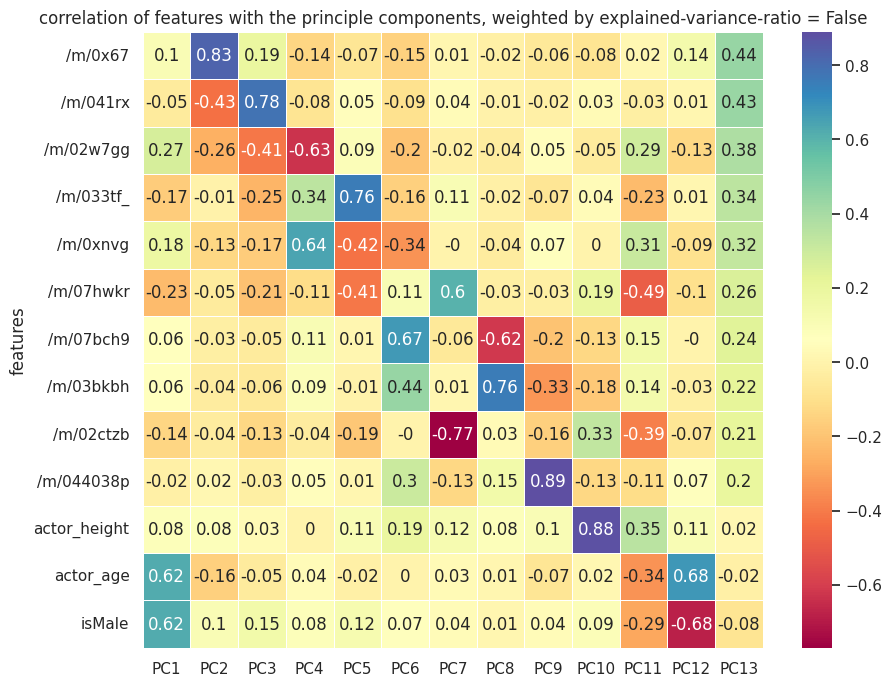

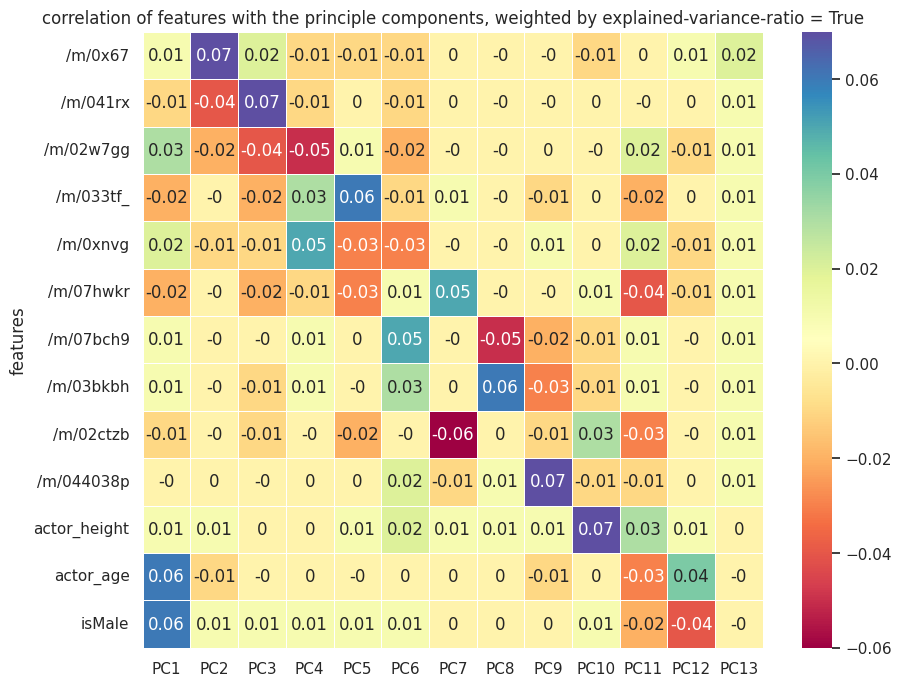

/home/tkoch/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


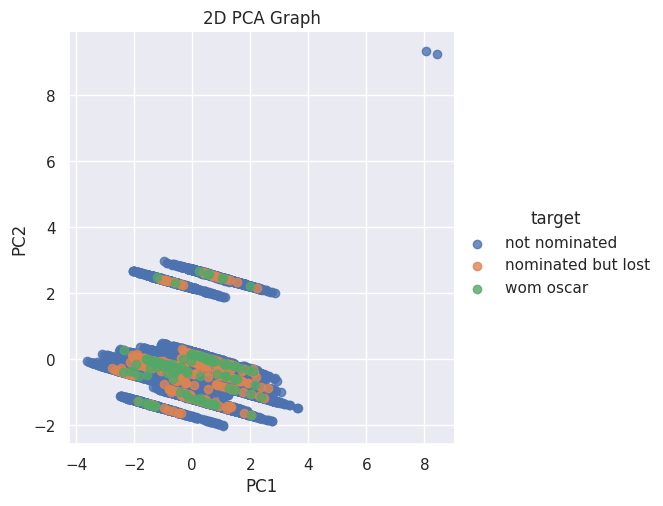

In [127]:
ac_cols = get_top_n_columns_by_sum(actor_features.iloc[:, 3:])
ac_cols.extend(['actor_height', 'actor_age', 'isMale'])
ac_df=actor_features[ac_cols]
pca_res_ac, pca_out_ac = run_pca_analysis(ac_df)
elbow_plot(pca_out_ac)
pca_heatmap(pca_out_ac, ac_df, False, round=2)
pca_heatmap(pca_out_ac, ac_df, True, round=2)
pca_scatter_plot(pca_res_ac, target)